# Visual Genome Region Description Embeddings

In [1]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np
from visual_genome import api as vg
import urllib.request
from PIL import Image
import tensorflow as tf
import json
import nltk
import time
import torch
import re
import seaborn as sns
import pandas as pd
from nltk.cluster import KMeansClusterer
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer, util
from nltk.cluster import KMeansClusterer
from scipy.spatial import distance_matrix, distance
from sklearn.manifold import TSNE

## Images visualizations

In [3]:
def visualize_regions(image, regions):
    fig = plt.gcf()
    fig.set_size_inches(18.5, 10.5)
    img = Image.open(urllib.request.urlopen(image.url))
    plt.imshow(img)
    ax = plt.gca()
    for region in regions:
        ax.add_patch(Rectangle((region.x, region.y),
                               region.width,
                               region.height,
                               fill=False,
                               edgecolor='red',
                               linewidth=3))
        ax.text(region.x, region.y, region.phrase, style='italic', bbox={'facecolor':'white', 'alpha':0.7, 'pad':10})
    fig = plt.gcf()
    plt.tick_params(labelbottom='off', labelleft='off')
    plt.show()

In [4]:
def retrieve_image(image_id):
    # find the image from api
    image = vg.get_image_data(id=image_id)   # api also works here
    if image:
        print ("Image data:", image)
        reg = vg.get_region_descriptions_of_image(id=image_id)
        # show images
        visualize_regions(image, reg[:8])    # call with fewer regions for better visualization

## SentenceTransformer

In [5]:
# pre-trained models
#model_1 = SentenceTransformer('bert-base-nli-mean-tokens')
#model_2 = SentenceTransformer('paraphrase-mpnet-base-v2')    # raises warning
model_3 = SentenceTransformer('paraphrase-distilroberta-base-v2')
#model_4 = SentenceTransformer('stsb-mpnet-base-v2')
#model_5 = SentenceTransformer('stsb-roberta-large')         # this is much slower, but the best for semantic similarity
models = [model_3]

In [6]:
def get_embeddings(model, region_sentences):
    sentence_embeddings = model.encode(region_sentences)
    return sentence_embeddings

## Read images and their descriptions


In [7]:
image_regions = pd.read_csv("image_regions.xls")

In [31]:
image_regions.head()

,Image_id,region_sentences,embeddings_3
0,1,"[the clock is green in colour, shade is along ...","[0.13024494, -0.075843364, -0.21067682, -0.326..."
1,2,"[walk sign is lit up, man wearing silver backp...","[0.1280979, 0.0021448717, -0.26843265, -0.2215..."
2,3,"[multi-line office phone system, electrical an...","[0.010052222, 0.33125025, 0.15597467, -0.35265..."
3,4,"[blue curtains with sailboats on them., a blac...","[-0.4083862, -0.06272134, -0.18911257, -0.3786..."
4,5,"[the floor is wooden, white cables are on the ...","[-0.2711325, 0.20002456, 0.018807273, -0.46869..."


In [9]:
image_regions["region_sentences"] = image_regions["region_sentences"].apply(eval)
regions = image_regions["region_sentences"].tolist()

# Get embeddings

In [10]:
key_list = [ "embeddings_3"]
embeddings = dict.fromkeys(key_list)
for model, key in zip(models, key_list):
    values = []
    for corpus in regions:
        # returns a list of lists, one 768-length embedding per region sentence. 
        # Number of rows corresponds to number of sentences
        if corpus:
            emb = get_embeddings(model, corpus)
            # get mean value columnwise, so that sentence embeddings are averaged per region for each image
            emb = np.mean(np.array(emb), axis=0) 
            # for each model, a 768-length embedding is stored
            values.append(emb)
        else:
            values.append(0)
            print(0)

    embeddings[key] = values

In [11]:
for key in key_list:
    image_regions[key] = pd.Series(embeddings[key], index=image_regions.index) 
    # number of sentences x 768

In [12]:
image_regions.head()

,Image_id,region_sentences,embeddings_3
0,1,"[the clock is green in colour, shade is along ...","[0.13024494, -0.075843364, -0.21067682, -0.326..."
1,2,"[walk sign is lit up, man wearing silver backp...","[0.1280979, 0.0021448717, -0.26843265, -0.2215..."
2,3,"[multi-line office phone system, electrical an...","[0.010052222, 0.33125025, 0.15597467, -0.35265..."
3,4,"[blue curtains with sailboats on them., a blac...","[-0.4083862, -0.06272134, -0.18911257, -0.3786..."
4,5,"[the floor is wooden, white cables are on the ...","[-0.2711325, 0.20002456, 0.018807273, -0.46869..."


# Clustering

In [14]:
def clustering_question(images_regions, key, NUM_CLUSTERS):

    sentences = images_regions['region_sentences']

    X = np.array(images_regions[key].tolist())

    data = images_regions[['Image_id', 'region_sentences', key]].copy()
    
    kclusterer = KMeansClusterer(
        NUM_CLUSTERS, distance=nltk.cluster.util.cosine_distance,
        avoid_empty_clusters=True)

    assigned_clusters = kclusterer.cluster(data[key], assign_clusters=True)

    data['cluster'] = pd.Series(assigned_clusters, index=data.index)
    data['centroid'] = data['cluster'].apply(lambda x: kclusterer.means()[x])

    return data, assigned_clusters

In [15]:
def distance_from_centroid(row):
    # type of emb and centroid is different, hence using tolist below
    return distance_matrix([row[key]], [row['centroid'].tolist()])[0][0]

In [ ]:
def nltk_inertia(feature_matrix, centroid):
    sum_ = []
    for i in range(feature_matrix.shape[0]):
        sum_.append(np.sum((feature_matrix[i] - centroid[i])**2)) 
    return sum(sum_) 
def number_of_clusters(image_regions, key):
    sse = []
    list_k = list(range(10, 1000, 10))

    for k in list_k:
        data, assigned_clusters = clustering_question(image_regions, key, k)
        sse.append(nltk_inertia(data[key].to_numpy(), data.centroid.to_numpy()))

    # Plot sse against k
    plt.figure(figsize=(6, 6))
    plt.title('Elbow method for '+key)
    plt.plot(list_k, sse, '-o')
    plt.xlabel(r'Number of clusters k')
    plt.ylabel('Sum of squared distance')
    plt.show()
"""
for key in key_list:
    number_of_clusters(image_regions, key)
"""

In [36]:
n_clusters = 15

def make_clusters(key, images_regions, n_clusters):
    data, assigned_clusters = clustering_question(images_regions, key, NUM_CLUSTERS = n_clusters)
    # Compute centroid distance to the data
    data['distance_from_centroid'] = data.apply(distance_from_centroid, axis=1)
    return data

## TSNE visualizations

In [37]:
def tsne_visual(embedding_clusters, key):
    mat = np.matrix([x for x in embedding_clusters[key]])
    t_sne = TSNE(n_components=2)
    low_dim_data = t_sne.fit_transform(mat)
    print('Lower dim data has shape',low_dim_data.shape)
    tsne_df =  pd.DataFrame(low_dim_data, embedding_clusters['cluster'])
    plt.figure(figsize=(20,12))
    ax = sns.scatterplot(data=tsne_df[0], x=tsne_df[0], y=tsne_df[1], hue=tsne_df.index, palette = "viridis", s=80)
    ax.set_title('T-SNE BERT Embeddings')
    plt.show()
    return low_dim_data

## Similar image retrieval

In [18]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

In [47]:
def find_distances(images_regions, input_id, key, input_embedding = np.zeros(5)):
    distances = []     
    image_ids=images_regions.Image_id
    if input_id>0:
        reference_embedding = images_regions.loc[images_regions.Image_id == input_id][key]
        reference_embedding = reference_embedding.values[0].reshape(-1,1)
        corpus_embeddings = images_regions.loc[images_regions.Image_id != input_id][key]
    else:
        reference_embedding = input_embedding
        corpus_embeddings = images_regions[key]
        
    for j in range(len(corpus_embeddings)):  # rows of def_embeddings matrix
        defin = j
        if image_ids[j]!=input_id:      # avoid calculating distance with itself
            corpus = corpus_embeddings[j].reshape(-1,1)
            # euclidean distance between multidimensional vectors
            dist = distance.euclidean(reference_embedding, corpus)
            distances.append([image_ids[j], dist]) 
        
    # store in df
    col_names = ['image_id', 'distances']
    distances_df = pd.DataFrame(distances, columns=col_names)
    distances_df = distances_df.sort_values(by='distances', ascending=True)
    distances_df.to_csv('distances.csv', index=False)
    return distances_df

In [48]:
# given image id to retrieve its k most similar images

def retrieve_images(key, images_regions, input_id = -1, input_embedding = np.zeros(5)):
    print('Images retrieved using method:', key)
    top_k=10
    
    if input_id>0:
    # top_k results to return
        print('Reference image:', input_id)
        retrieve_image(input_id)
        distances_df=find_distances(images_regions, input_id, key)
    else:
        distances_df=find_distances(images_regions, input_id, key, input_embedding)
    top_images=distances_df.head(top_k)

    print("Top", top_k, "most similar images to image", input_id, "in Visual Genome:")
    for index, row in top_images.iterrows():   
        im_id = int(row.image_id)
        print("Image id:", im_id, "Euclidean distance: %.4f" % (row.distances))

        # find similar images from api and show
        retrieve_image(im_id)

    return top_images

# Method 3: paraphrase-distilroberta-base-v2

In [38]:
embeddings_method = "embeddings_3"
embedding_clusters=make_clusters(embeddings_method, image_regions, n_clusters)
embedding_clusters.head(5)

,Image_id,region_sentences,embeddings_3,cluster,centroid,distance_from_centroid
0,1,"[the clock is green in colour, shade is along ...","[0.13024494, -0.075843364, -0.21067682, -0.326...",7,"[0.052943293, 0.0071960087, -0.31614512, -0.44...",4.021766
1,2,"[walk sign is lit up, man wearing silver backp...","[0.1280979, 0.0021448717, -0.26843265, -0.2215...",7,"[0.052943293, 0.0071960087, -0.31614512, -0.44...",3.443042
2,3,"[multi-line office phone system, electrical an...","[0.010052222, 0.33125025, 0.15597467, -0.35265...",1,"[-0.009074482, 0.22866015, 0.024504568, -0.199...",3.277082
3,4,"[blue curtains with sailboats on them., a blac...","[-0.4083862, -0.06272134, -0.18911257, -0.3786...",10,"[-0.26342887, -0.04864537, -0.27498877, -0.422...",4.124239
4,5,"[the floor is wooden, white cables are on the ...","[-0.2711325, 0.20002456, 0.018807273, -0.46869...",1,"[-0.009074482, 0.22866015, 0.024504568, -0.199...",4.314369


Lower dim data has shape (108076, 2)


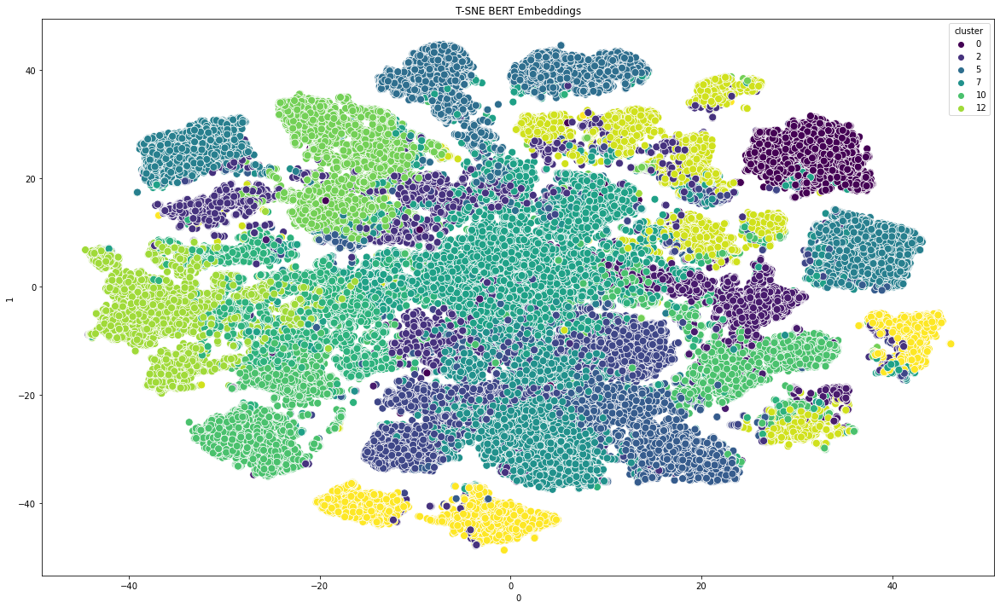

In [39]:
low_embedding_clusters=tsne_visual(embedding_clusters, embeddings_method)

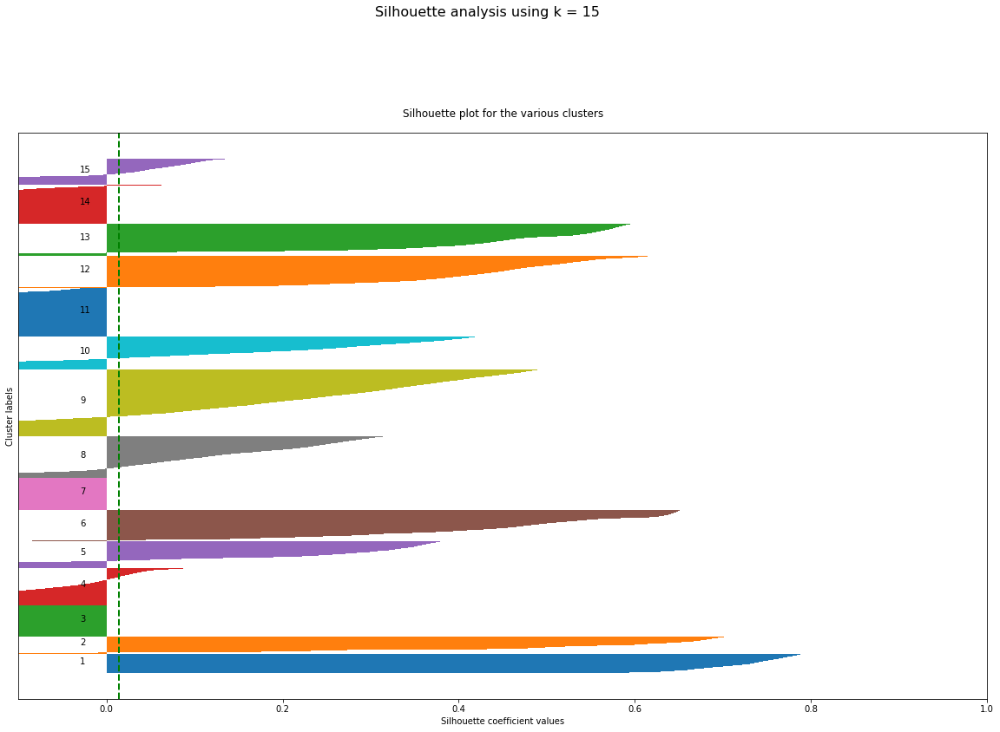

In [40]:
from sklearn.metrics import silhouette_samples, silhouette_score

# Get silhouette samples
plt.figure(figsize=(20,12))

embedding_samples = low_embedding_clusters
labels = embedding_clusters['cluster'].to_numpy()
silhouette_vals = silhouette_samples(embedding_samples, labels)

# Silhouette plot
y_ticks = []
y_lower, y_upper = 0, 0
for i, cluster in enumerate(np.unique(labels)):
    cluster_silhouette_vals = silhouette_vals[labels == cluster]
    cluster_silhouette_vals.sort()
    y_upper += len(cluster_silhouette_vals)
    plt.barh(range(y_lower, y_upper), cluster_silhouette_vals, edgecolor='none', height=1)
    plt.text(-0.03, (y_lower + y_upper) / 2, str(i + 1))
    y_lower += len(cluster_silhouette_vals)


avg_score = np.mean(silhouette_vals)
plt.axvline(avg_score, linestyle='--', linewidth=2, color='green')
plt.yticks([])
plt.xlim([-0.1, 1])
plt.xlabel('Silhouette coefficient values')
plt.ylabel('Cluster labels')
plt.title('Silhouette plot for the various clusters', y=1.02);

plt.suptitle(f'Silhouette analysis using k = {n_clusters}',
             fontsize=16, y=1.05)
plt.show()

In [41]:
embedding_samples.shape

(108076, 2)

In [42]:
labels.shape

(108076,)

## Similar image retrieval based on given image id


Images retrieved using method: embeddings_3
Reference image: 1
Image data: id: 1, coco_id: -1, flickr_id: -1, width: 800, url: https://cs.stanford.edu/people/rak248/VG_100K_2/1.jpg


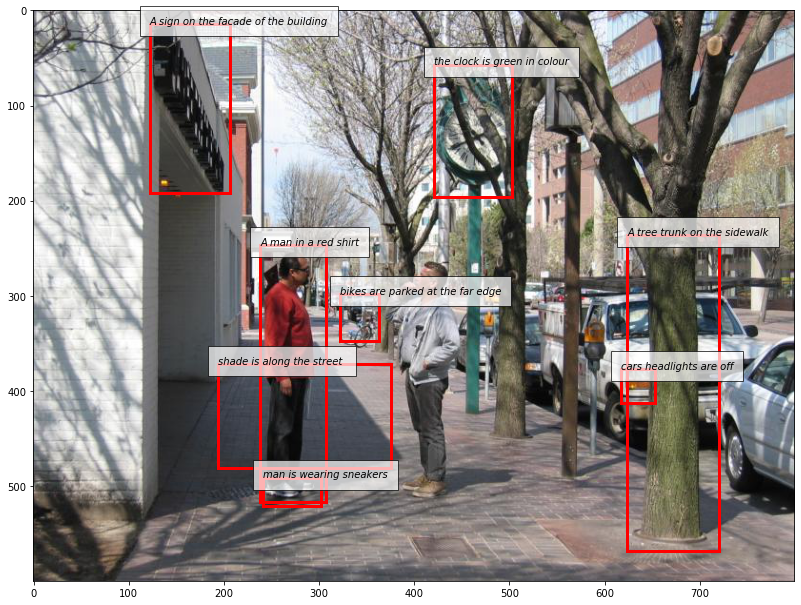

Top 10 most similar images to image 1 in Visual Genome:
Image id: 2410466 Euclidean distance: 3.2664
Image data: id: 2410466, coco_id: 7938, flickr_id: 1327113850, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2410466.jpg


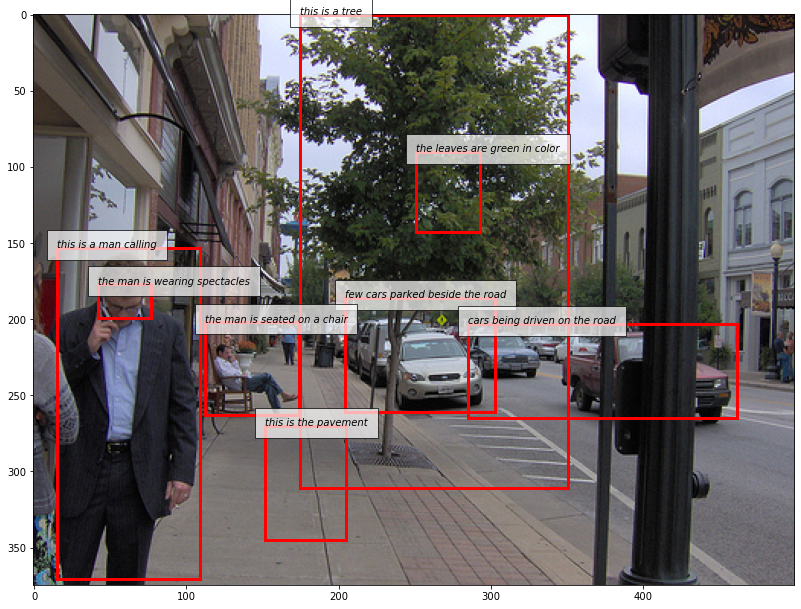

Image id: 16 Euclidean distance: 3.4900
Image data: id: 16, coco_id: -1, flickr_id: -1, width: 800, url: https://cs.stanford.edu/people/rak248/VG_100K/16.jpg


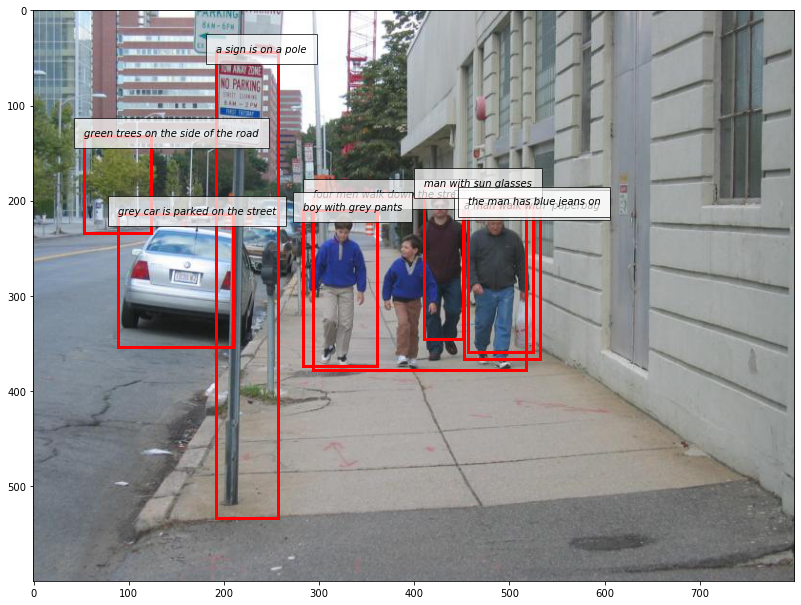

Image id: 2353277 Euclidean distance: 3.6128
Image data: id: 2353277, coco_id: 178181, flickr_id: 335688758, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2353277.jpg


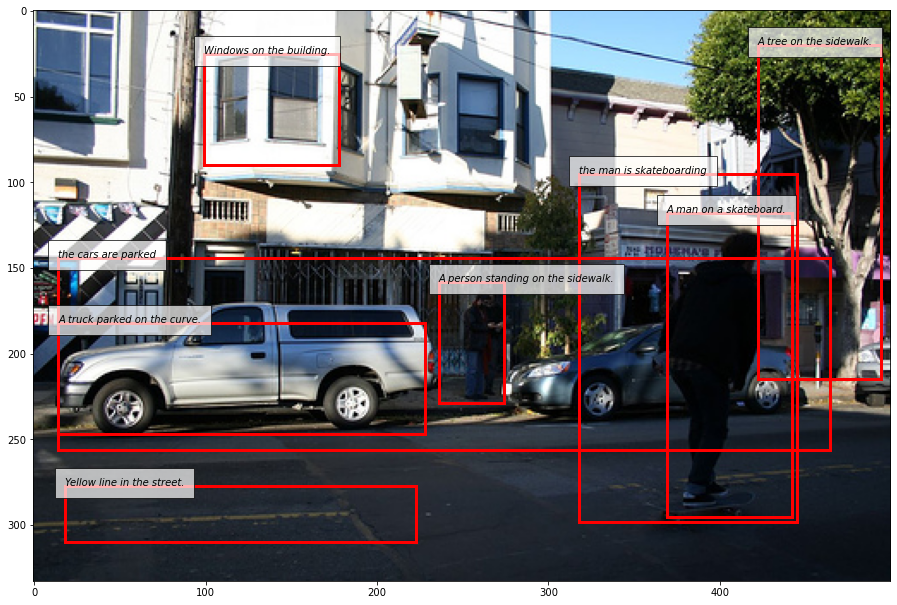

Image id: 48 Euclidean distance: 3.6134
Image data: id: 48, coco_id: -1, flickr_id: -1, width: 800, url: https://cs.stanford.edu/people/rak248/VG_100K/48.jpg


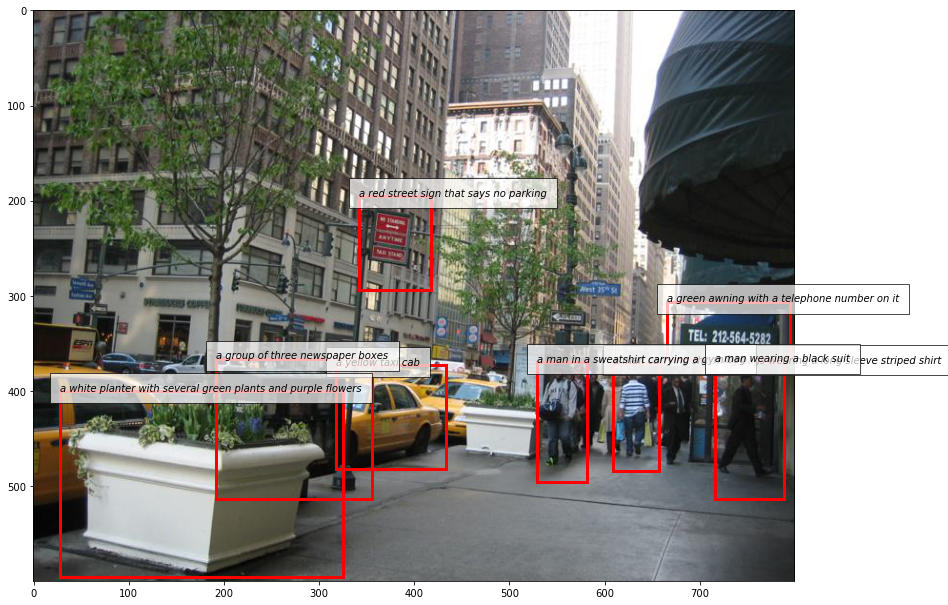

Image id: 26 Euclidean distance: 3.6302
Image data: id: 26, coco_id: -1, flickr_id: -1, width: 800, url: https://cs.stanford.edu/people/rak248/VG_100K/26.jpg


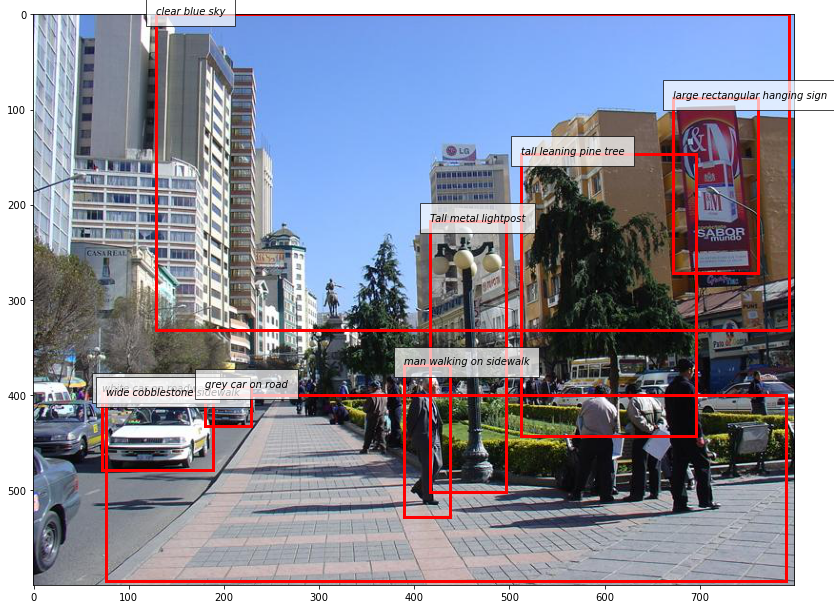

Image id: 2384574 Euclidean distance: 3.6644
Image data: id: 2384574, coco_id: 444262, flickr_id: 478095572, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2384574.jpg


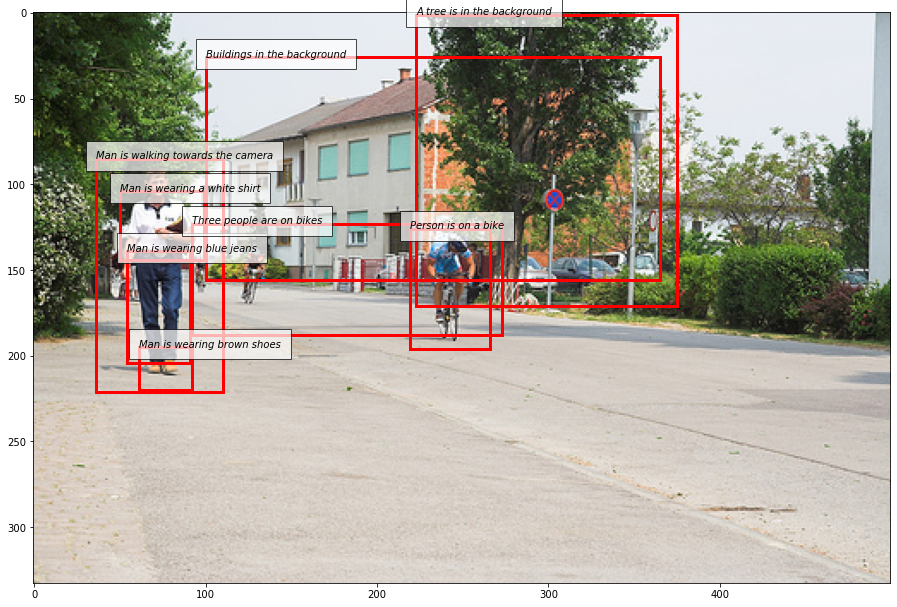

Image id: 2385406 Euclidean distance: 3.6721
Image data: id: 2385406, coco_id: -1, flickr_id: 6873974821, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2385406.jpg


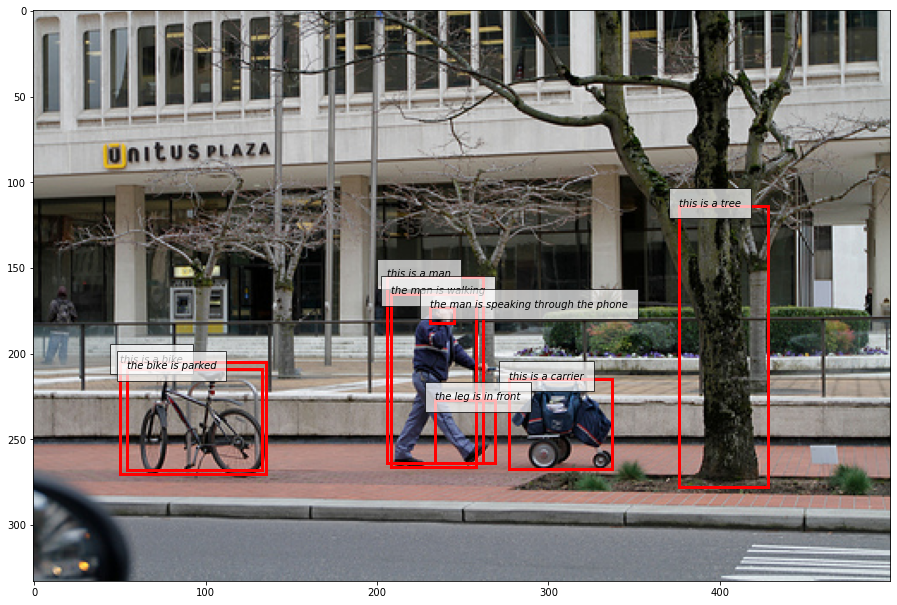

Image id: 2399301 Euclidean distance: 3.6743
Image data: id: 2399301, coco_id: 234352, flickr_id: 6818821217, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2399301.jpg


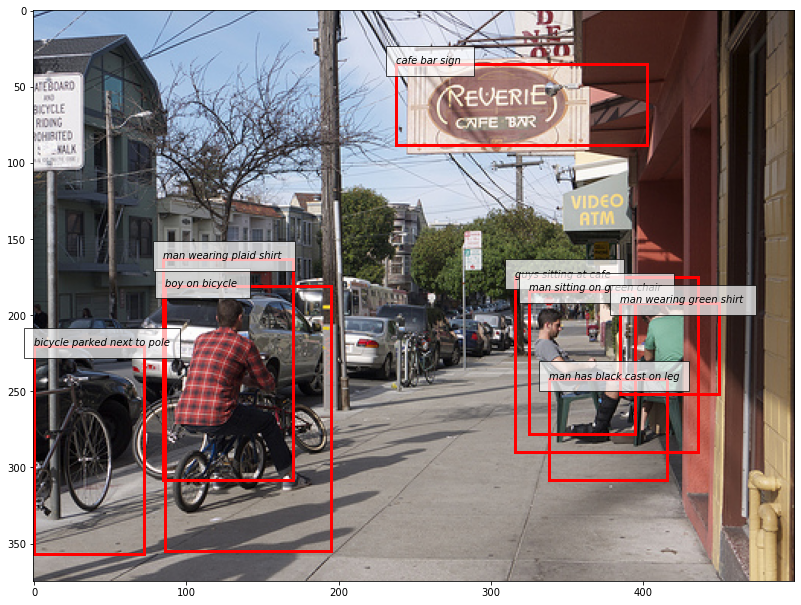

Image id: 498105 Euclidean distance: 3.7695
Image data: id: 498105, coco_id: 528729, flickr_id: 5858166375, width: 1024, url: https://cs.stanford.edu/people/rak248/VG_100K/498105.jpg


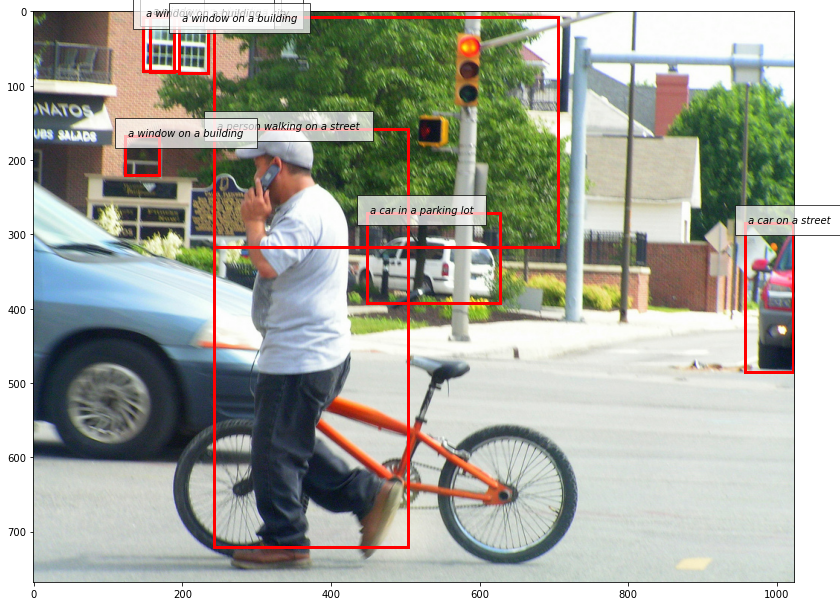

Image id: 2377786 Euclidean distance: 3.7908
Image data: id: 2377786, coco_id: -1, flickr_id: 7156085969, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2377786.jpg


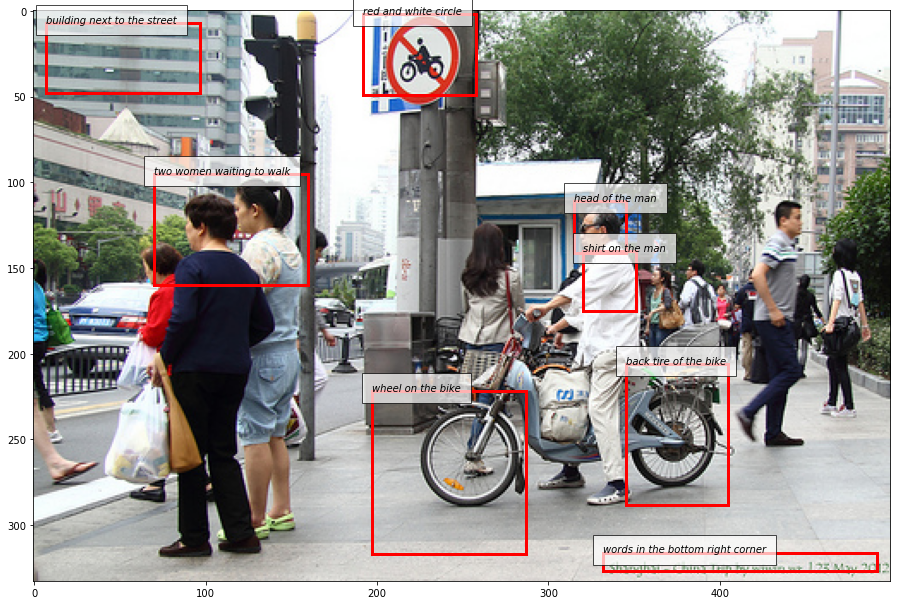

In [49]:
input_id = 1
top_images = retrieve_images(embeddings_method, image_regions, input_id = input_id)

In [23]:
top_images

,image_id,distances
11897,2410466,3.266442
14,16,3.490005
66537,2353277,3.612828
46,48,3.613430
24,26,3.630166
36656,2384574,3.664420
35857,2385406,3.672059
22565,2399301,3.674299
6300,498105,3.769528
43120,2377786,3.790775


## Similar image retrieval based on given user sentence


In [50]:
input_sentence = 'a cat is sleeping on the beach'

In [51]:
input_embedding = get_embeddings(model_3, input_sentence)

Images retrieved using method: embeddings_3
Top 10 most similar images to image -1 in Visual Genome:
Image id: 2348432 Euclidean distance: 13.6845
Image data: id: 2348432, coco_id: -1, flickr_id: 2853395373, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2348432.jpg


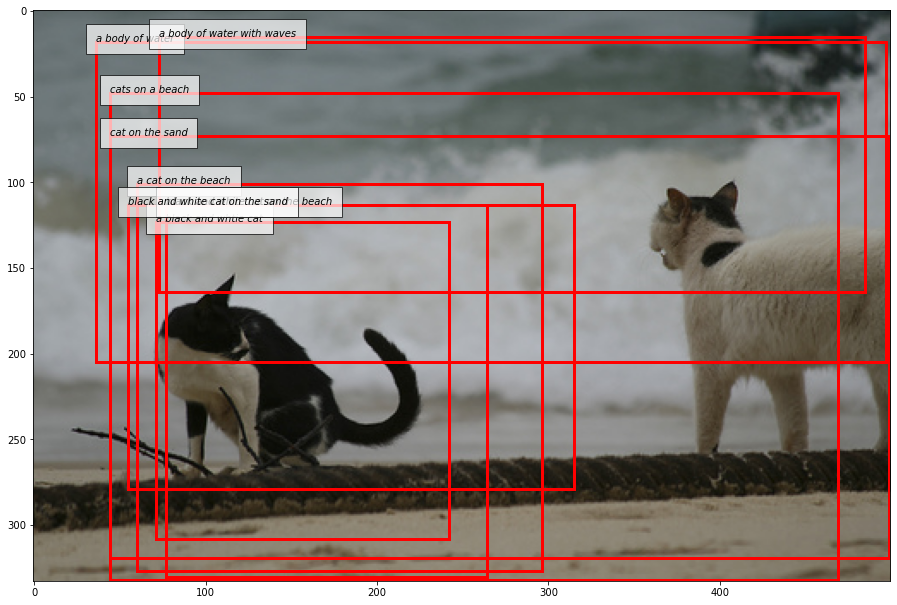

Image id: 2382711 Euclidean distance: 13.9909
Image data: id: 2382711, coco_id: -1, flickr_id: 4383704655, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2382711.jpg


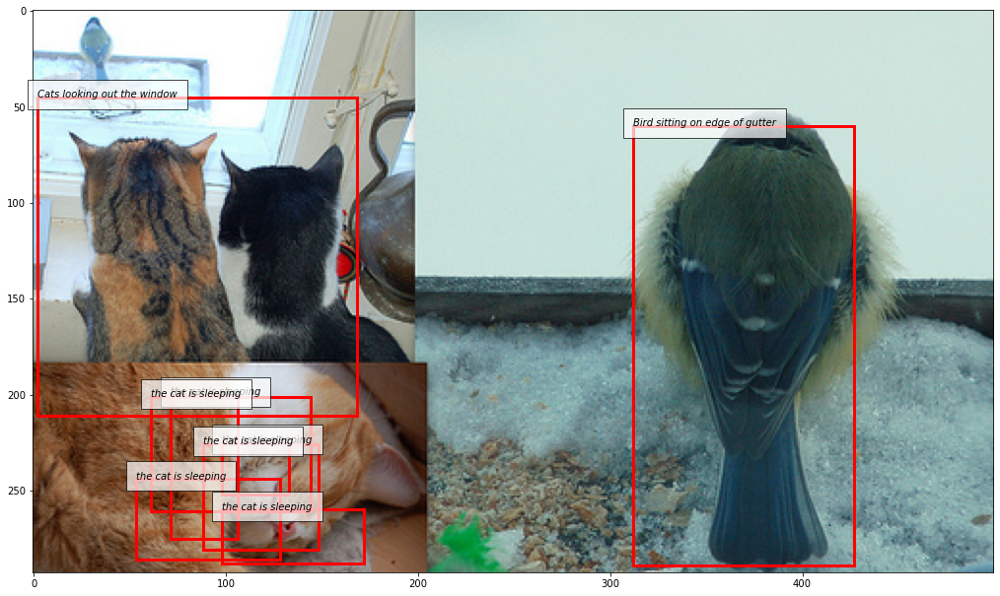

Image id: 2327334 Euclidean distance: 14.1096
Image data: id: 2327334, coco_id: -1, flickr_id: 760075481, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2327334.jpg


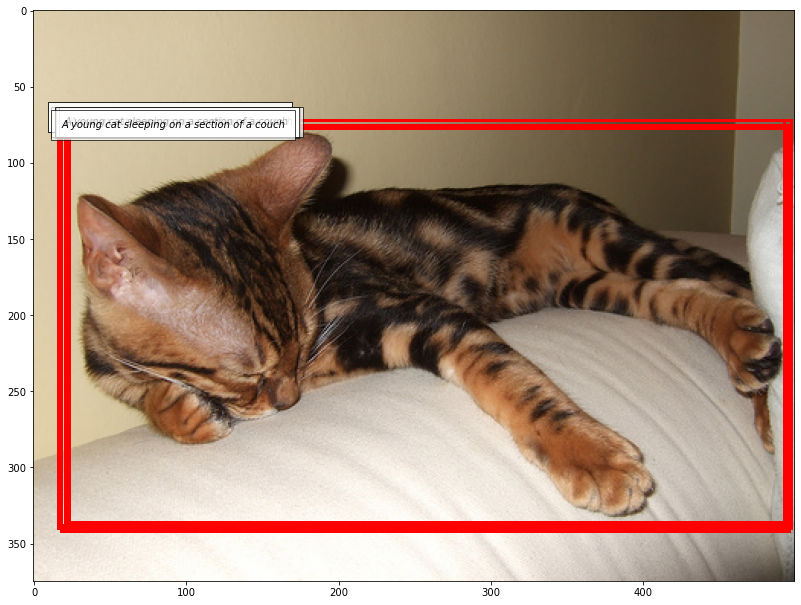

Image id: 2341662 Euclidean distance: 14.1784
Image data: id: 2341662, coco_id: 45208, flickr_id: 2323574426, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2341662.jpg


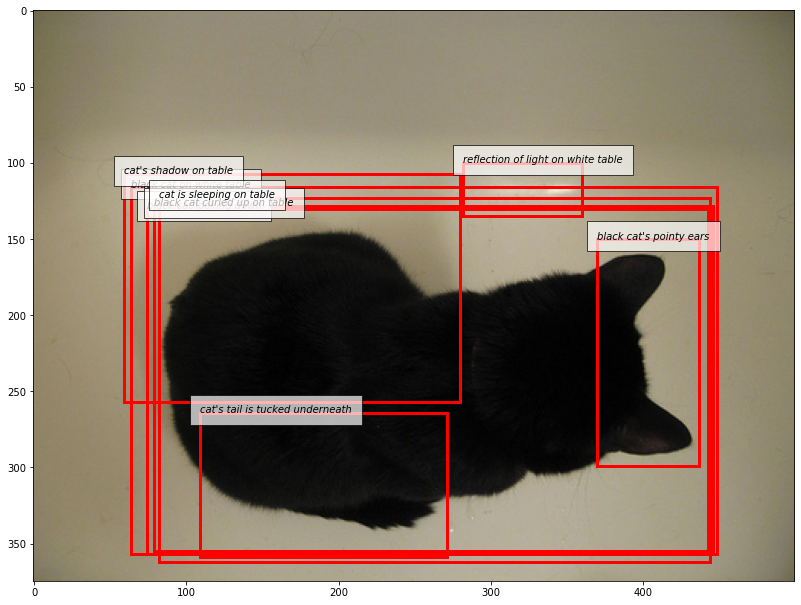

Image id: 2356841 Euclidean distance: 14.2211
Image data: id: 2356841, coco_id: 235842, flickr_id: 2546904630, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2356841.jpg


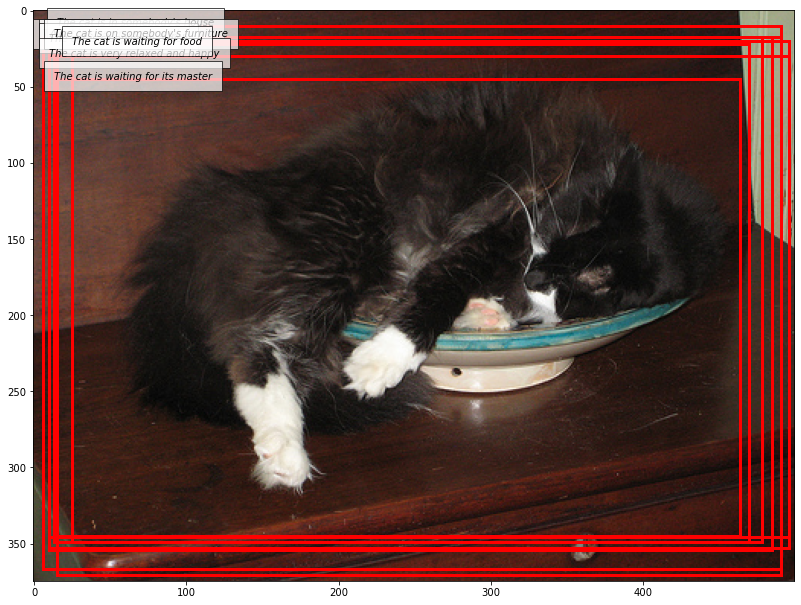

Image id: 2316261 Euclidean distance: 14.2551
Image data: id: 2316261, coco_id: 325598, flickr_id: 9059944697, width: 279, url: https://cs.stanford.edu/people/rak248/VG_100K/2316261.jpg


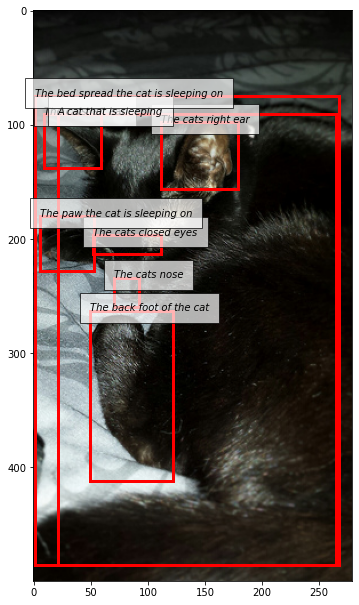

Image id: 2329523 Euclidean distance: 14.2769
Image data: id: 2329523, coco_id: -1, flickr_id: 6817724539, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2329523.jpg


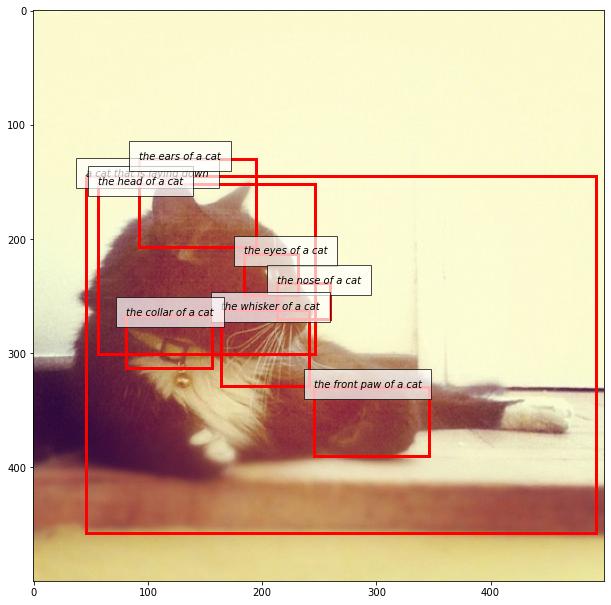

Image id: 2402592 Euclidean distance: 14.3117
Image data: id: 2402592, coco_id: 504147, flickr_id: 8455485640, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2402592.jpg


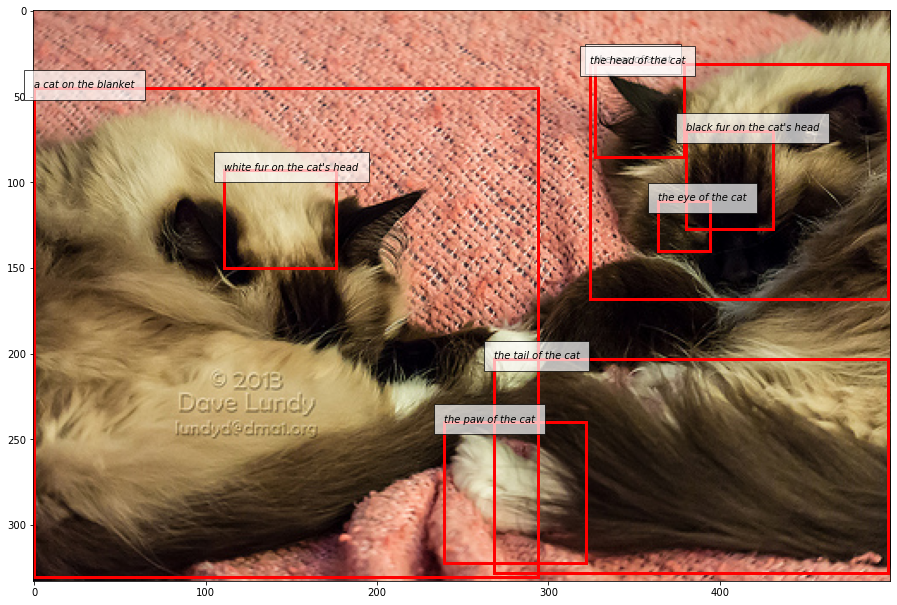

Image id: 2399563 Euclidean distance: 14.3355
Image data: id: 2399563, coco_id: 168817, flickr_id: 4230601623, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2399563.jpg


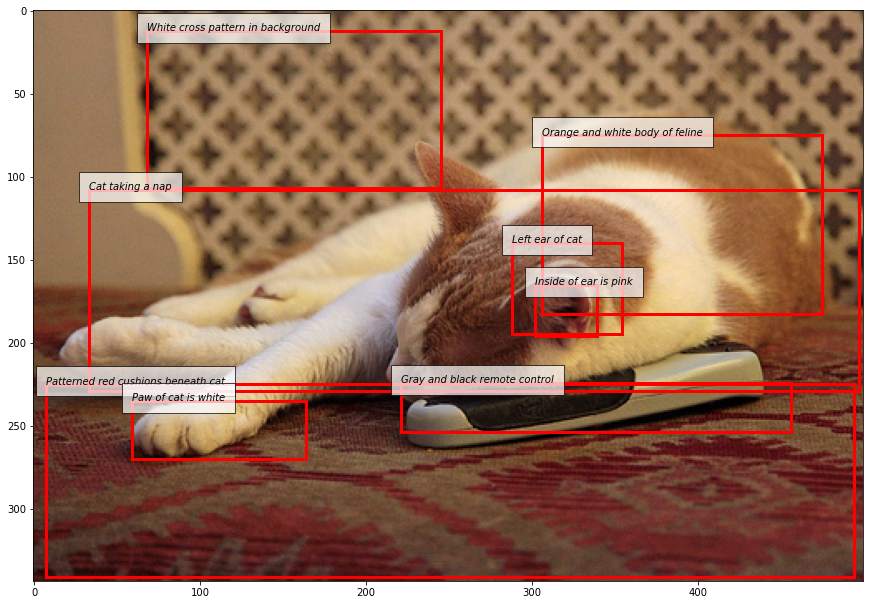

Image id: 2358131 Euclidean distance: 14.3387
Image data: id: 2358131, coco_id: 39769, flickr_id: 210383891, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2358131.jpg


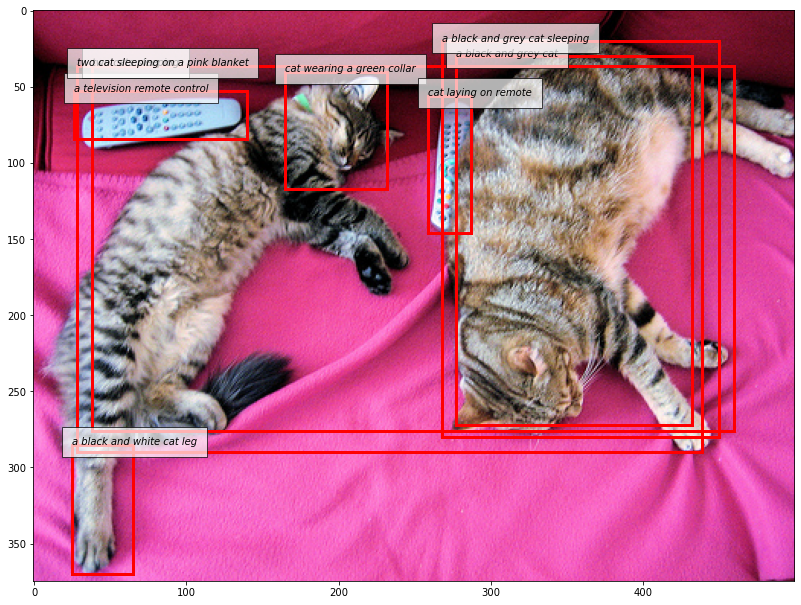

In [52]:
top_images_2 = retrieve_images(embeddings_method, image_regions, input_id = -1, input_embedding=input_embedding)

In [53]:
top_images_2

,image_id,distances
71175,2348432,13.684477
38440,2382711,13.990886
91313,2327334,14.109632
77629,2341662,14.178384
63134,2356841,14.221121
101929,2316261,14.255106
89227,2329523,14.276907
19416,2402592,14.311678
22316,2399563,14.335526
61919,2358131,14.338696
